In [7]:
import JSAnimation
import IPython.display
import matplotlib

In [8]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [9]:
# Perfect sensor
def sense(x):
    return x

In [10]:
def simulate(Δt, robot, u):
    robot += Δt * u
    return robot

In [69]:
def control(t, pos):
    ### WRITE YOUR CONTROL POLICY HERE:
    kp = 1
    ki = .5
    p_d=[((sin(5*t)+2)*cos(t)), (sin(5*t)+2)*sin(t)]
    ux = 0
    uy = 0
    
    if t >= 0 and t < 1:
        ux = 15
        uy = 0
    elif t >=1 and t < 2:
        ux = 0
        uy = 4
    elif t >=2 and t < 3:
        ux = -11
        uy = 0
    elif t >=3 and t < 4:
        ux = 0
        uy = 9
    elif t >=4 and t < 5:
        ux = 4
        uy = 0
    elif t >=5 and t < 6:
        ux = 0
        uy = -5
    elif t >=6 and t < 7:
        ux = -3
        uy = 0
    elif t >=7 and t < 8:
        ux = 0
        uy = 9
    elif t >=8 and t < 9:
        ux = 9
        uy = 0
        
    return array([ux, uy])

In [70]:
tf = 10.
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
robot = array([-5.0,-7.0])
x_log = [copy(robot)]

for t in time:
    pos = sense(robot)
    u = control(t, pos)
    robot = simulate(Δt, robot, u)
    x_log.append(copy(robot))
    
x_log = array(x_log)

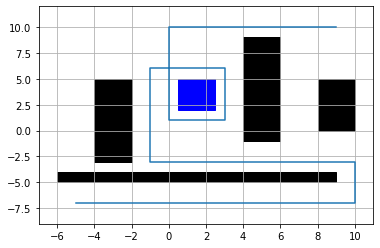

In [71]:
fig = plt.figure()
ax = fig.add_subplot(111)
grid = matplotlib.pyplot.grid()
plot = matplotlib.pyplot.plot(x_log[:,0], x_log[:,1])
rect1 = matplotlib.patches.Rectangle((-6, -5), 15, 1, color ='black')
rect2 = matplotlib.patches.Rectangle((4,-1), 2, 10, color ='black')
rect3 = matplotlib.patches.Rectangle((.5, 2), 2, 3, color ='blue')
rect4 = matplotlib.patches.Rectangle((8, 0), 2, 5, color ='black')
rect5 = matplotlib.patches.Rectangle((-4, -3), 2, 8, color ='black')




ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)
plt.xlim([-7,11])
plt.ylim([-9,12])
plt.show()

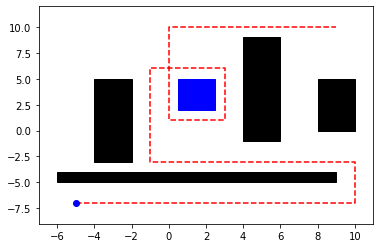

In [74]:
import matplotlib.pyplot as plt
from matplotlib import animation 
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    rect1 = matplotlib.patches.Rectangle((-6, -5), 15, 1, color ='black')
    rect2 = matplotlib.patches.Rectangle((4,-1), 2, 10, color ='black')
    rect3 = matplotlib.patches.Rectangle((.5, 2), 2, 3, color ='blue')
    rect4 = matplotlib.patches.Rectangle((8, 0), 2, 5, color ='black')
    rect5 = matplotlib.patches.Rectangle((-4, -3), 2, 8, color ='black')




    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(rect5)
    plt.xlim([-7,11])
    plt.ylim([-9,12])
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())